In [2]:
import sys; sys.path.append('../..')
from abslithist import *

FileNotFoundError: [Errno 2] No such file or directory: '/home/ryan/github/abslithist/data/fields'

In [ ]:
!ls -l {COUNT_DIR}

In [1]:
# !lltk download sellars metadata
# !lltk download sellars txt

In [ ]:
count_files = [
    f'{COUNT_DIR}/data.absconc.CanonFiction.v6.csv.ft',
    f'{COUNT_DIR}/data.absconc.OldBailey.v7.csv.ft',
    f'{COUNT_DIR}/data.absconc.ecco_tcp.v7.csv.ft',
    f'{COUNT_DIR}/data.absconc.tedjdh.v7.csv.ft',
    f'{COUNT_DIR}/data.absconc.sellars.v7.csv.ft',
    f'{COUNT_DIR}/data.absconc.eebo_tcp.v7.csv.ft',
]

In [ ]:
df=pd.DataFrame()
for fn in count_files:
    print('>> loading:',fn)
    cdf=pd.read_feather(fn)
    cdf['corpus']=cname=fn.split('.')[2]
    meta=lltk.load(cname).metadata
    # if cname=='sellars':
    #     bad_ids=meta[meta.genre.isin({'Fiction','Poetry','Drama'})].id
    #     cdf=cdf[~cdf.id.isin(bad_ids)]

    if cname!='CanonFiction':
        good_ids=meta[meta.title.str.contains('Essay')].id
        print(cname,len(cdf))
        cdf=cdf[cdf.id.isin(good_ids)]
        print(len(cdf))
        print()

    id2year=dict(zip(meta.id,meta.year))
    cdf['year']=cdf['id'].apply(lambda x: id2year.get(x))
    df=df.append(cdf)
df['abs-conc']=df['num_abs']-df['num_conc']
df['dec']=df['year'].apply(lambda y: y//10*10)
df

In [11]:
plotdf = df.groupby(['corpus','period','year']).mean().reset_index()
plotdf = plotdf[plotdf.year>=1485]
plotdf

,corpus,period,year,slice,num_abs,num_conc,num_neither,num_total,num_types,index,abs-conc,dec
29,CanonFiction,C16,1485.0,347.000000,9.479076,20.901876,69.594517,99.975469,75.425685,NaN,-11.422799,1480.0
30,CanonFiction,C16,1500.0,53.000000,17.495238,11.752381,70.523810,99.771429,85.333333,NaN,5.742857,1500.0
31,CanonFiction,C16,1508.0,145.930057,19.323251,12.750473,67.807183,99.880907,88.251418,NaN,6.572779,1500.0
32,CanonFiction,C16,1509.0,56.000000,31.585586,9.882883,58.369369,99.837838,94.315315,NaN,21.702703,1500.0
33,CanonFiction,C16,1516.0,475.987665,12.474890,18.973568,68.491630,99.940088,93.047577,NaN,-6.498678,1510.0
...,...,...,...,...,...,...,...,...,...,...,...,...
7996,tedjdh,orig,1895.0,10.214286,0.142857,2.714286,1.928571,4.785714,4.785714,36168.571429,-2.571429,1890.0
7997,tedjdh,orig,1896.0,20.666667,0.666667,4.750000,7.083333,12.500000,12.333333,28246.333333,-4.083333,1890.0
7998,tedjdh,orig,1897.0,22.000000,0.500000,4.142857,6.214286,10.857143,10.785714,24240.071429,-3.642857,1890.0
7999,tedjdh,orig,1898.0,15.809524,0.238095,2.809524,5.095238,8.142857,8.142857,33575.095238,-2.571429,1890.0


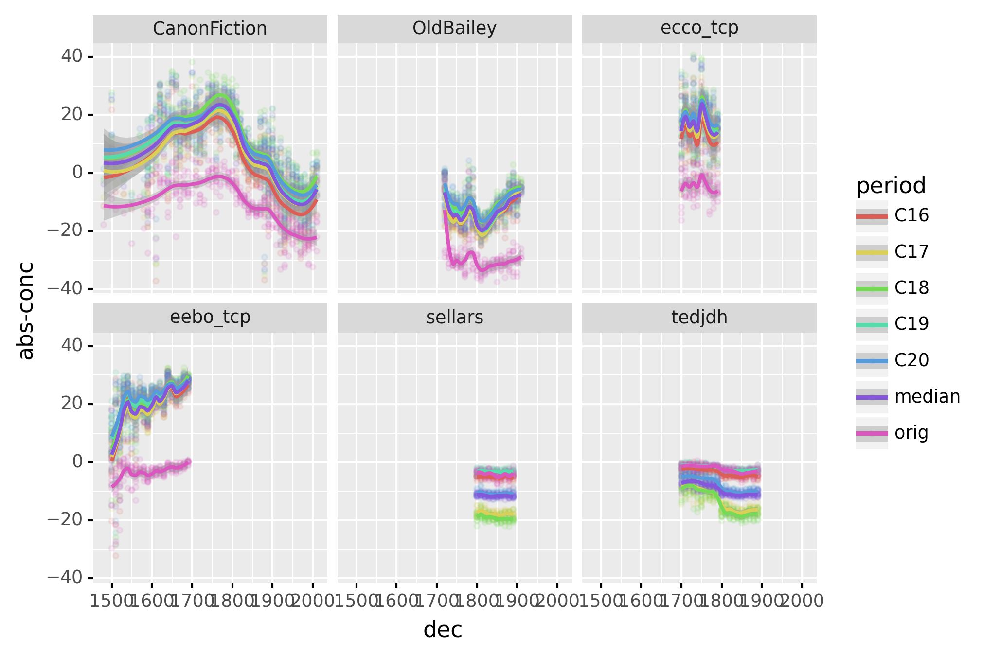

<ggplot: (8767126613973)>

In [12]:
fig=p9.ggplot(p9.aes(x='dec',y='abs-conc',color='period'), data=plotdf)
fig+=p9.geom_point(size=1,alpha=0.1)
fig+=p9.geom_smooth(se=True,method='loess',span=0.333)
fig+=p9.facet_wrap('corpus')
fig

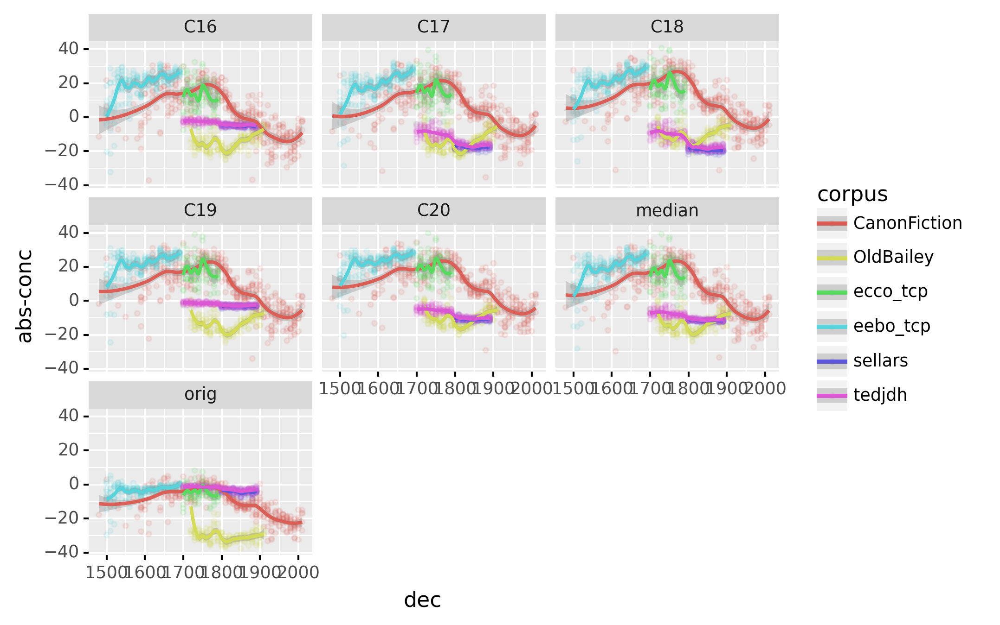

<ggplot: (8765901329201)>

In [16]:
fig=p9.ggplot(p9.aes(x='dec',y='abs-conc',color='corpus'), data=plotdf)
fig+=p9.geom_point(size=1,alpha=0.1)
fig+=p9.geom_smooth(se=True,method='loess',span=0.333)
fig+=p9.facet_wrap('period')
fig